## Network dynamics analysis of networks trained on fixed probability offset task

### Task, inputs, and network

**Patch-foraging task.** The agent runs along a virtual 1-D treadmill (`treadmill_env_jax.py`). Each timestep it chooses one of two actions — **stay** (don't advance) or **go** (advance one position). The track is organized into *patches*; within a patch the agent encounters a sequence of *reward sites* marked by an odor cue, separated by odor-free gaps (inter-site distances drawn from a truncated exponential). To attempt reward at a site the agent must **dwell (stay) for 3 consecutive steps**; reward is then delivered probabilistically. The reward probability *decays exponentially with the number of rewards already collected in the patch* (`p = prefactor · exp(−reward_sum / decay_const)`), so patches deplete. There are 3 patch types that differ in their reward statistics (the "fixed probability offset" setting: a fixed per-patch-type initial reward probability / offset). The agent must decide how long to keep foraging a patch before leaving to travel to the next one — i.e. solve a patch-leaving / optimal-foraging problem — to maximize long-run reward rate.

**Network inputs (7-dim).** Each step the network receives `[obs(4), prev_action_onehot(2), prev_reward(1)]`:
- `obs[0]` — visual cue: 1 while the agent is inside a patch, else 0.
- `obs[1:4]` — three odor channels, one per patch type; the channel for the current patch type is 1 while the agent is in a reward site, else 0.
- `prev_action` — one-hot of the previous action (stay, go).
- `prev_reward` — reward received on the previous step.

**Network (`A2CRNNFlax`).** An actor–critic recurrent network: two separate **GRU** cells (64 hidden units each) for the actor and the critic, each with small additive Gaussian noise on the hidden state. Linear heads read out from the recurrent activity:
- **actor** → 2 action logits (stay / go),
- **critic** → scalar state value,
- plus auxiliary prediction heads (environment quality, exponentially-filtered reward rate, next-observation) used as training objectives.

Networks are trained with A2C; this notebook analyzes the dynamics of the trained actor GRU (`actor_hidden`) via PCA, fixed points, and patch-progress representations.

### Setup
Imports and environment configuration: JAX (pinned to CPU), the A2C‑RNN agent, the treadmill environment, and the trajectory/plotting helper modules, plus the matplotlib font.

In [1]:
%load_ext autoreload
%autoreload 2

import os
os.environ["JAX_PLATFORM_NAME"] = "cpu"
import sys
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from pathlib import Path
import jax
import jax.numpy as jnp
from flax.training import checkpoints
from flax import serialization
from agents.a2c_rnn_flax import A2CRNNFlax, init_network_and_params
from environments.components.train_state import create_train_state
from environments.treadmill_env_jax import treadmill_session_default_params
import matplotlib.pyplot as plt
from nb_analysis_tools import load_trajectory_data, parse_behavioral_data
from aux_funcs import format_plot, format_pc_plot
import numpy as np
from sklearn.decomposition import PCA
import seaborn as sns
from copy import copy
from nb_dynamics_plotting import *

plt.rcParams['font.family'] = 'Helvetica Light'

Paths to the saved rollout data (hidden states + behavior, one `.pkl` per trained network) and the matching network weight checkpoints.

In [43]:
import glob
import re

# All saved rollouts and matching weight checkpoints for this run, across every
# curriculum step (step_00, step_01, ...). Each entry is a training snapshot;
# the two lists are paired by session index (traj_000000 <-> checkpoint_0, ...).
_HBL_RESULTS = '../../../results/fixed_exp_gru_initial_prob_offset_high_becomes_low'
_HBL_CHECKPOINTS = '../../../checkpoints/fixed_exp_gru_initial_prob_offset_high_becomes_low'

# checkpoint_N is not zero-padded, so sort by the trailing integer (not lexically)
# to keep the two lists aligned.
CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES = sorted(
    glob.glob(f'{_HBL_RESULTS}/step_*/traj_*.pkl'),
    key=lambda p: int(re.search(r'traj_(\d+)\.pkl$', p).group(1)),
)

# Saved network weights
CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS = sorted(
    glob.glob(f'{_HBL_CHECKPOINTS}/step_*/checkpoint_*'),
    key=lambda p: int(re.search(r'checkpoint_(\d+)$', p).group(1)),
)

print(f'{len(CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES)} trajectories, '
      f'{len(CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS)} checkpoints')

30 trajectories, 30 checkpoints


Architecture / training hyperparameters needed to reconstruct the network so the saved weights can be loaded into it, and the 7‑D input size (`obs(4) + prev_action(2) + prev_reward(1)`).

In [44]:
# Some config variables so that network weights can actually be loaded
HIDDEN_SIZE = 64
ACTION_SIZE = 2
OBS_SIZE = 4
RNN_TYPE = "GRU"
UNIT_NOISE_STD = 1e-2
LEARNING_RATE = 0
SEED = 0
NUM_ENVS = 1

# Configuration
CONFIG = {
    'hidden_size': 64,
    'action_size': 2,
    'obs_size': 4,
    'rnn_type': 'GRU',  # or 'VANILLA'
    'unit_noise_std': 0.0,
}

# Define input context
# Input format: [obs(4), prev_action_onehot(2), prev_reward(1)]
input_dim = CONFIG['obs_size'] + CONFIG['action_size'] + 1

Instantiate the A2C‑RNN (`network`) and a `train_state` container into which per‑network checkpoints are restored later.

In [45]:
# --- INITIALIZE NETWORK + TRAIN STATE ---
rng_key = jax.random.key(SEED)
net_init_key, rng_key = jax.random.split(rng_key)

network, params = init_network_and_params(
    hidden_size=HIDDEN_SIZE,
    action_size=ACTION_SIZE,
    obs_size=OBS_SIZE,
    rnn_type=RNN_TYPE,
    unit_noise_std=UNIT_NOISE_STD,
    rng_key=net_init_key,
)

train_state = create_train_state(
    rng_key=rng_key,
    obs_size=OBS_SIZE,
    hidden_size=HIDDEN_SIZE,
    num_envs=NUM_ENVS,
    learning_rate=LEARNING_RATE,
    params=params,
)

### Quick example: run the model forward on a hand-defined input

### Run real states forward under the static input

Draw 20 hidden states from the trajectory file at timesteps where the **first input (visual cue) is off**, use them as initial conditions, and run them forward under the static input defined above. The 3-D PCA shows each trajectory (gray) with its start (green) and end (red) — a way to see where different real states flow to under a fixed input.

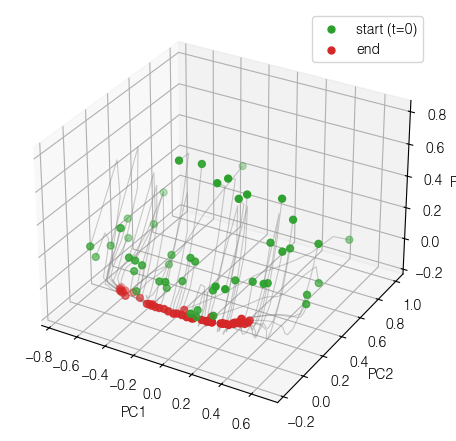

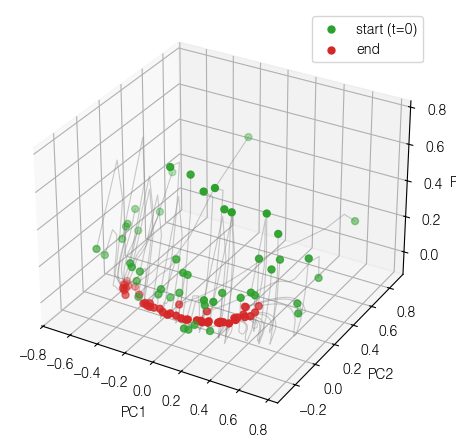

In [46]:
#  Load trained weights
weights_paths = [
    CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS[0],
    CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS[-1],
]

for ckpt_path in weights_paths:
    net_params = checkpoints.restore_checkpoint(
        ckpt_dir=Path(ckpt_path).resolve(), target=train_state).params


    network_eval = A2CRNNFlax(
        action_size=ACTION_SIZE, obs_size=OBS_SIZE, hidden_size=HIDDEN_SIZE,
        rnn_type=RNN_TYPE, unit_noise_std=0.0,
    )

    T = 30
    x_static = jnp.array([1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0])  # (7,)
    inputs = jnp.tile(x_static, (T, 1))

    # --- Draw 20 real states (visual cue off) from the trajectory file and run them
    #     forward under the same static input (`inputs`) defined above. ---
    raw = load_trajectory_data(CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES[0])
    traj = parse_behavioral_data(raw[0])
    obs_traj = np.asarray(traj['observations'])       # (n_steps, 7)
    actor_h_traj = np.asarray(traj['actor_hidden'])   # (n_steps, 64)
    critic_h_traj = np.asarray(traj['critic_hidden'])

    N_IC = 50
    rng = np.random.default_rng(0)
    ic_idx = rng.choice(jnp.arange(actor_h_traj.shape[0]), size=N_IC, replace=False)

    actor_h0 = jnp.asarray(actor_h_traj[ic_idx])      # (N_IC, 64)
    critic_h0 = jnp.asarray(critic_h_traj[ic_idx])

    # Run all N_IC states forward under the same static input, batched over the states.
    def forward_batch(carry, x_t):
        actor_h, critic_h, key = carry
        key, noise_key = jax.random.split(key)
        x_b = jnp.broadcast_to(x_t, (actor_h.shape[0], x_t.shape[0]))   # (N_IC, 7)
        _, _, actor_h, critic_h, *__ = network_eval.apply(
            net_params, x_b, actor_h, critic_h, rngs={'noise': noise_key})
        return (actor_h, critic_h, key), actor_h

    _, hidden_batch = jax.lax.scan(
        forward_batch, (actor_h0, critic_h0, jax.random.key(0)), inputs)
    hidden_batch = np.asarray(jnp.transpose(hidden_batch, (1, 0, 2)))   # (N_IC, T, 64)

    # 3D PCA of the forward trajectories (PCA fit on all forward states).
    pca_ic = PCA(n_components=3)
    pcs_ic = pca_ic.fit_transform(hidden_batch.reshape(-1, HIDDEN_SIZE)).reshape(N_IC, T, 3)

    fig = plt.figure(figsize=(5, 4.5))
    ax = fig.add_subplot(111, projection='3d')
    for i in range(N_IC):
        ax.plot(pcs_ic[i, :, 0], pcs_ic[i, :, 1], pcs_ic[i, :, 2], color='gray', alpha=0.4, lw=0.8)
    ax.scatter(pcs_ic[:, 0, 0], pcs_ic[:, 0, 1], pcs_ic[:, 0, 2],
            color='tab:green', s=25, label='start (t=0)')
    ax.scatter(pcs_ic[:, -1, 0], pcs_ic[:, -1, 1], pcs_ic[:, -1, 2],
            color='tab:red', s=25, label='end')
    ax.set_xlabel('PC1'); ax.set_ylabel('PC2'); ax.set_zlabel('PC3')
    ax.legend()
    plt.tight_layout()
    plt.show()

Load reward rates to see which networks pass threshold for reasonable performance

PCA on a single network. Dynamics during task are fairly low dimensional.

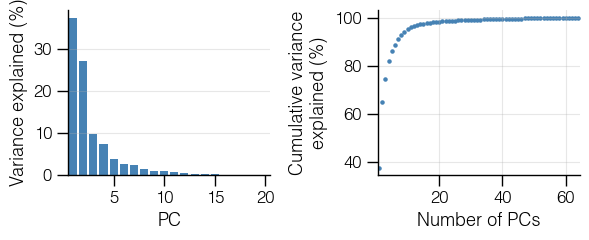

PCs to reach 90%: 7
PCs to reach 95%: 10


In [10]:
dir_path = CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES[0]

traj_data = {}

for env_idx in range(5):
    traj_data_raw = load_trajectory_data(dir_path)
    traj_data_env = parse_behavioral_data(traj_data_raw[env_idx])
    for key in traj_data_env.keys():
        if key in traj_data:
            traj_data[key] = np.concatenate([traj_data[key], traj_data_env[key]], axis=0)
        else:
            traj_data[key] = traj_data_env[key]
    
pca = PCA()
pca.fit(traj_data['actor_hidden'])
pc_activities = pca.transform(traj_data['actor_hidden'])

fig, axes = plt.subplots(1, 2, figsize=(6, 2.5))

evr  = pca.explained_variance_ratio_
cumr = np.cumsum(evr)
pcs  = np.arange(1, len(evr) + 1)

axes[0].bar(pcs, evr * 100, color='steelblue', width=0.8)
axes[0].set_xlabel('PC')
axes[0].set_ylabel('Variance explained (%)')
axes[0].set_xlim(0.5, min(20, len(evr)) + 0.5)
axes[0].grid(True, axis='y', alpha=0.3)

axes[1].scatter(pcs, cumr * 100, marker='o', s=5, color='steelblue')
axes[1].set_xlabel('Number of PCs')
axes[1].set_ylabel('Cumulative variance\nexplained (%)')
axes[1].set_xlim(0.5, len(evr) + 0.5)
axes[1].grid(True, alpha=0.3)

format_plot(axes)

plt.tight_layout()
plt.show()

print(f'PCs to reach 90%: {np.searchsorted(cumr, 0.90) + 1}')
print(f'PCs to reach 95%: {np.searchsorted(cumr, 0.95) + 1}')

### Plot single patch dynamics for each patch type
Hidden state trajectories are cylindrical spirals when projected into 3D. These trajectories rapidly circularly oscillate, but also follow a slower time course along a third dimension.

=== Network 0: ../../../results/fixed_exp_gru_initial_prob_offset_high_becomes_low/step_00/traj_000000.pkl ===


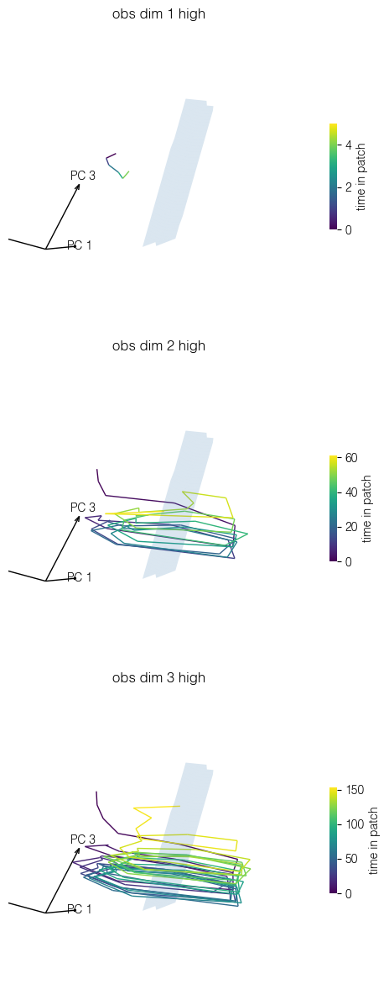

In [13]:
for net_idx, (dir_path, ckpt_path) in enumerate(zip(CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES, CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS)):

    if net_idx != 0:
        continue

    print(f'=== Network {net_idx}: {dir_path} ===')

    traj_data = {}
    for env_idx in range(5):
        traj_data_raw = load_trajectory_data(dir_path)
        traj_data_env = parse_behavioral_data(traj_data_raw[env_idx])
        for key in traj_data_env.keys():
            if key in traj_data:
                traj_data[key] = np.concatenate([traj_data[key], traj_data_env[key]], axis=0)
            else:
                traj_data[key] = traj_data_env[key]

    pca = PCA()
    pca.fit(traj_data['actor_hidden'])
    pc_activities = pca.transform(traj_data['actor_hidden'])

    net_restored = checkpoints.restore_checkpoint(ckpt_dir=Path(ckpt_path).resolve(), target=train_state)
    net_params = net_restored.params

    plot_patch_trajectories_3d(
        traj_data,
        max_trajectories=1,
        params=net_params,
        pca=pca,
        rz=80, rx=20, ry=0,
    )
None

### Fixed points of trained networks
Trained networks show a few common features:
1. A single fixed point or cluster of fixed points when the visual cue is off.
1. The emergence of a line of marginally stable fixed points when the visual cue is turned on and the agent is running.


Network 0


[[ 2.3156041e-03 -1.7366590e-02  1.3089454e-02  5.0629224e-03
   9.8786849e-01  3.2524772e-03 -4.2074192e-03]
 [ 9.9626291e-01  6.9112745e-03  5.5211171e-04  8.7720361e-03
   8.4750755e-03  1.0010519e+00  6.6033786e-04]
 [ 9.8436081e-01 -5.0032381e-03  8.5540358e-03  9.9404895e-01
  -3.8648567e-03  1.0070627e+00 -1.8060012e-02]
 [ 1.0092304e+00 -4.6705799e-03 -1.4717334e-03  1.0041496e+00
  -7.8733228e-03  1.0014797e+00  6.8270066e-04]
 [ 9.9065101e-01 -8.7349734e-04  2.9706145e-03  9.8779464e-01
  -8.6258417e-03  9.8670834e-01  2.9295324e-03]]
Trial 0, patch 3  (global steps 625–736, length 112)  → 112 segments with ≥2 steps


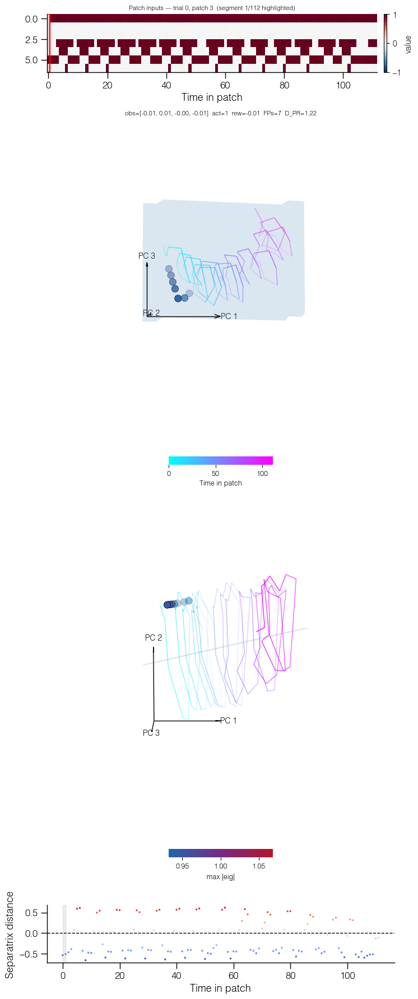

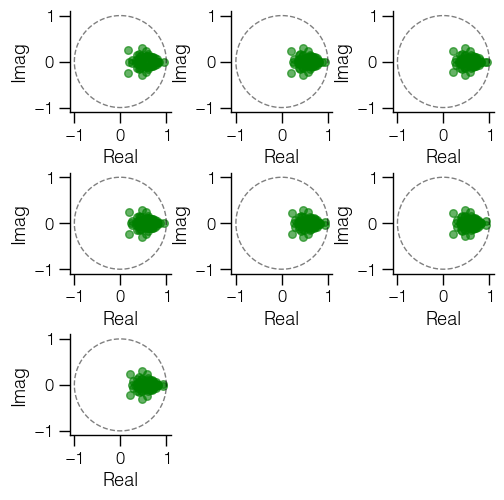

<Figure size 640x480 with 0 Axes>

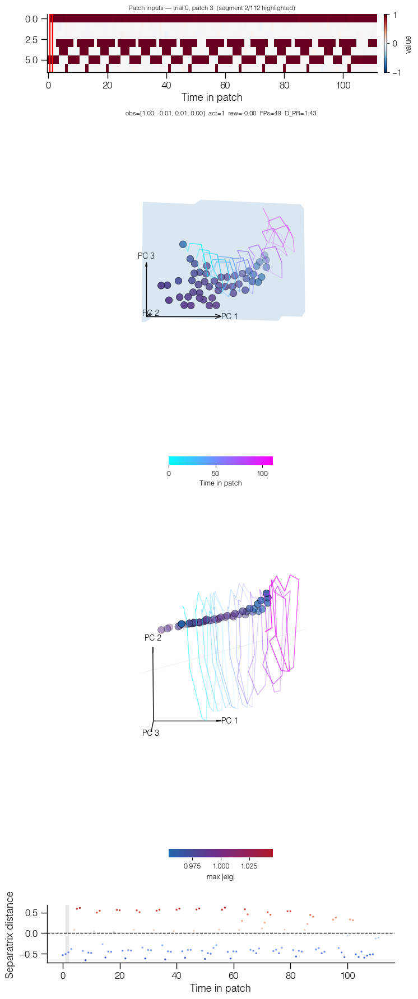

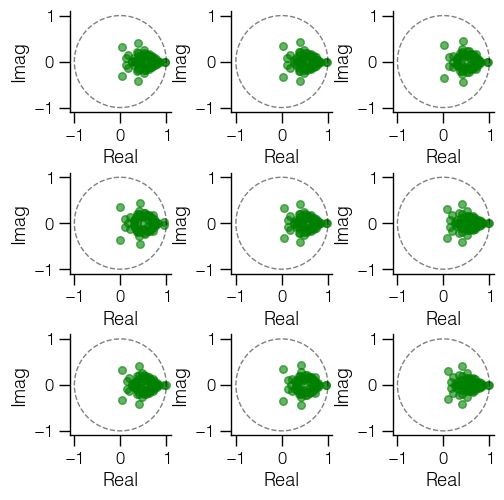

<Figure size 640x480 with 0 Axes>

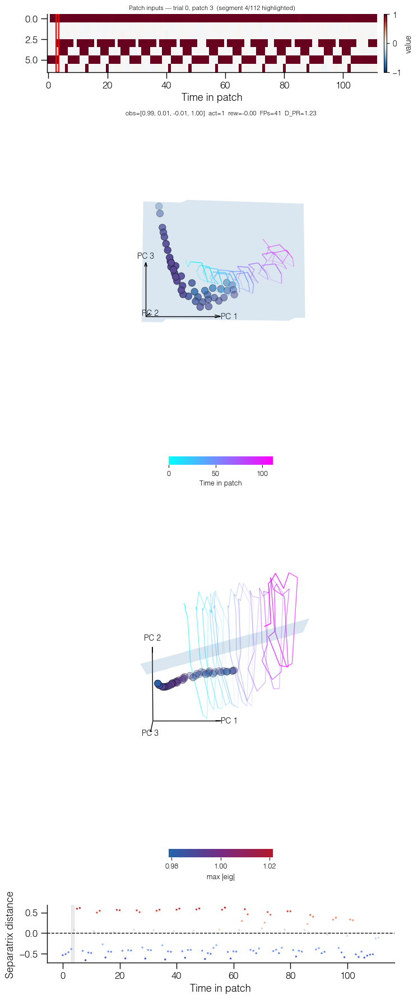

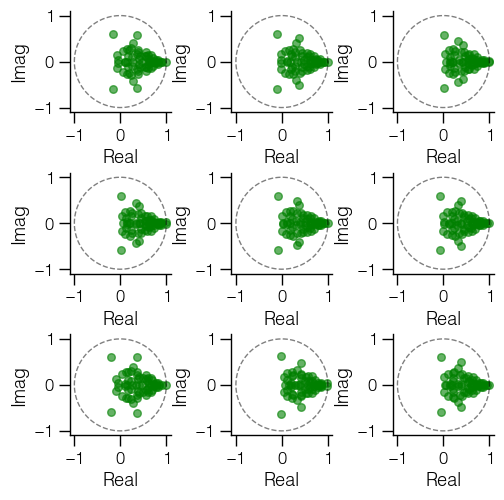

<Figure size 640x480 with 0 Axes>

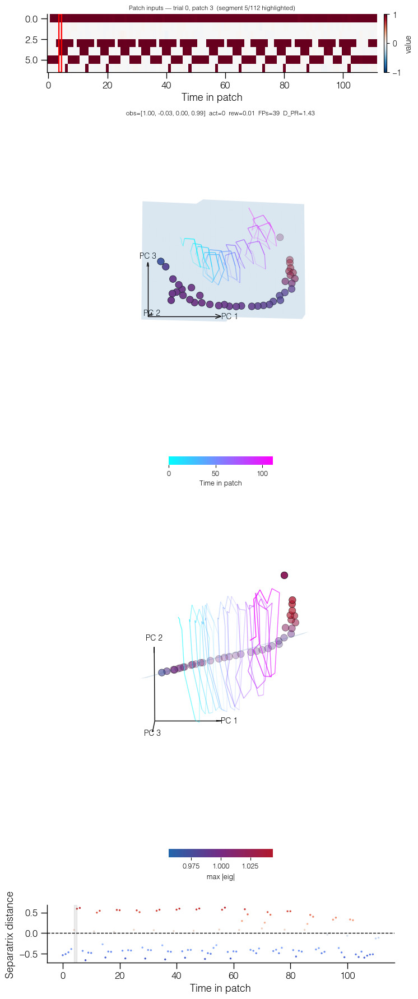

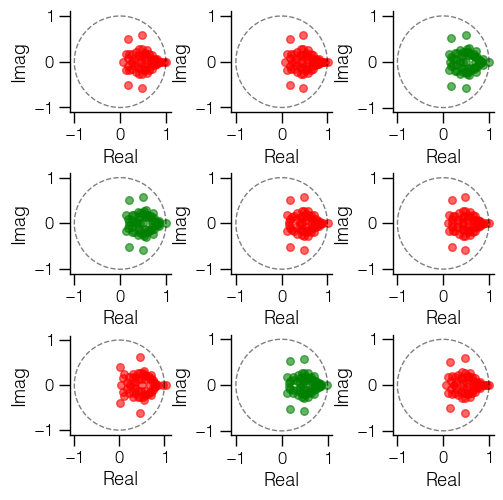

<Figure size 640x480 with 0 Axes>

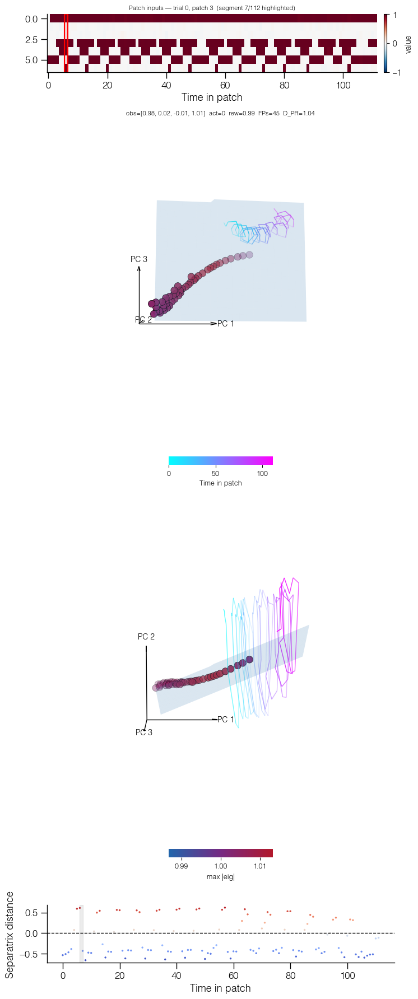

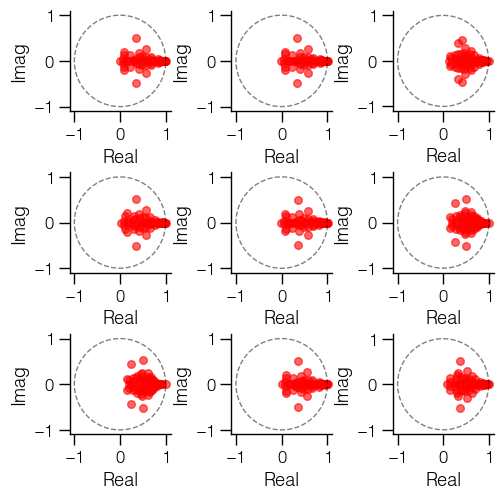

<Figure size 640x480 with 0 Axes>

Trial 0, patch 3  (global steps 625–736, length 112)  → 112 unique inputs


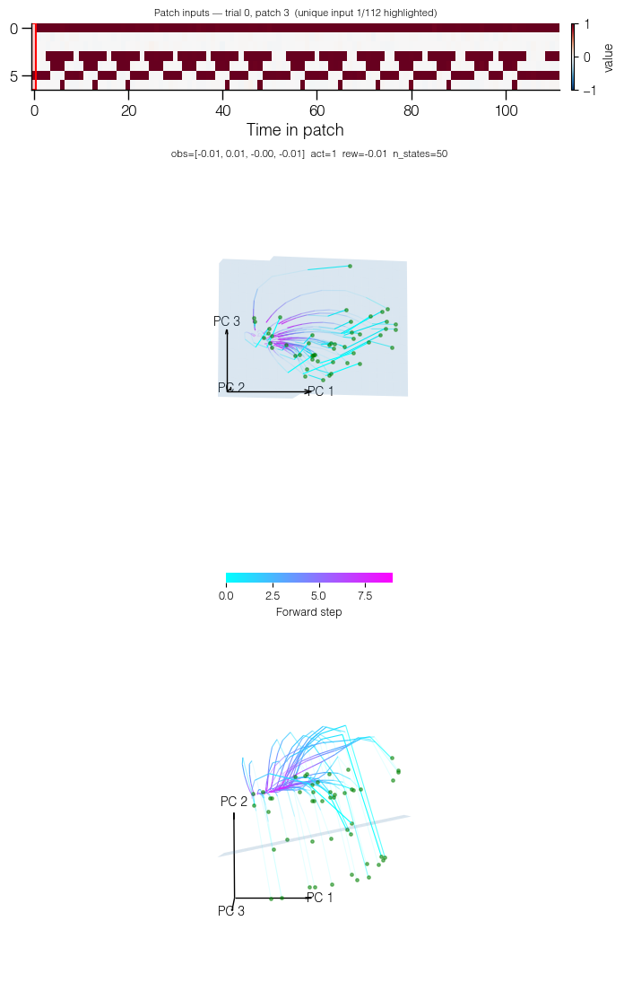

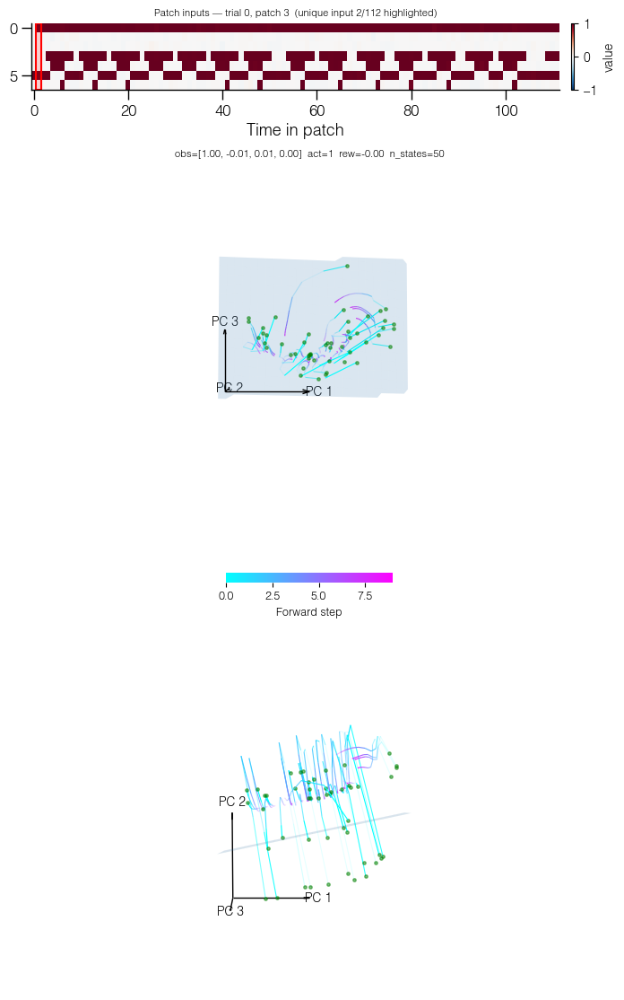

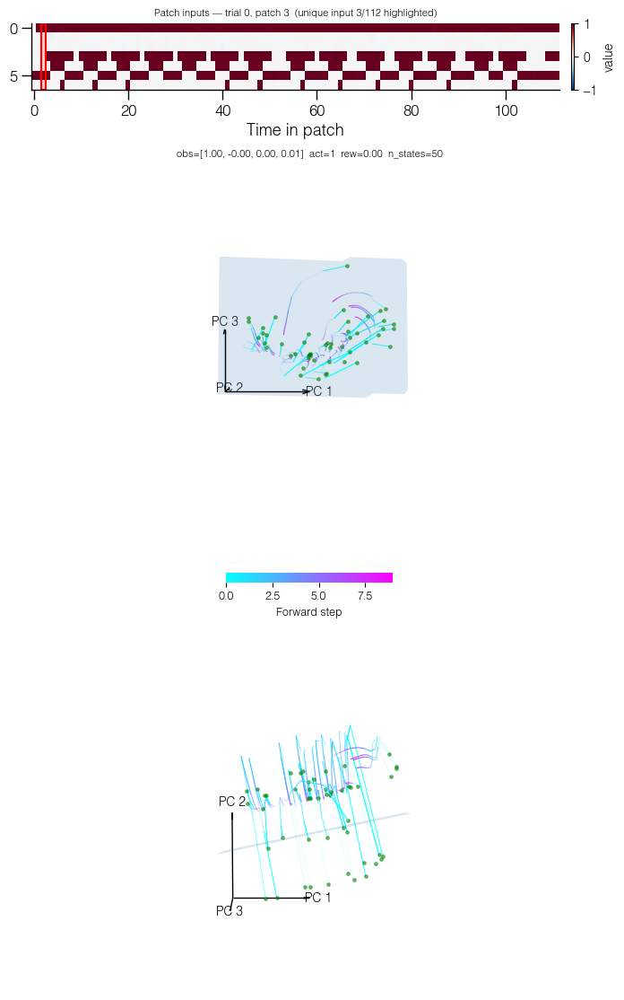

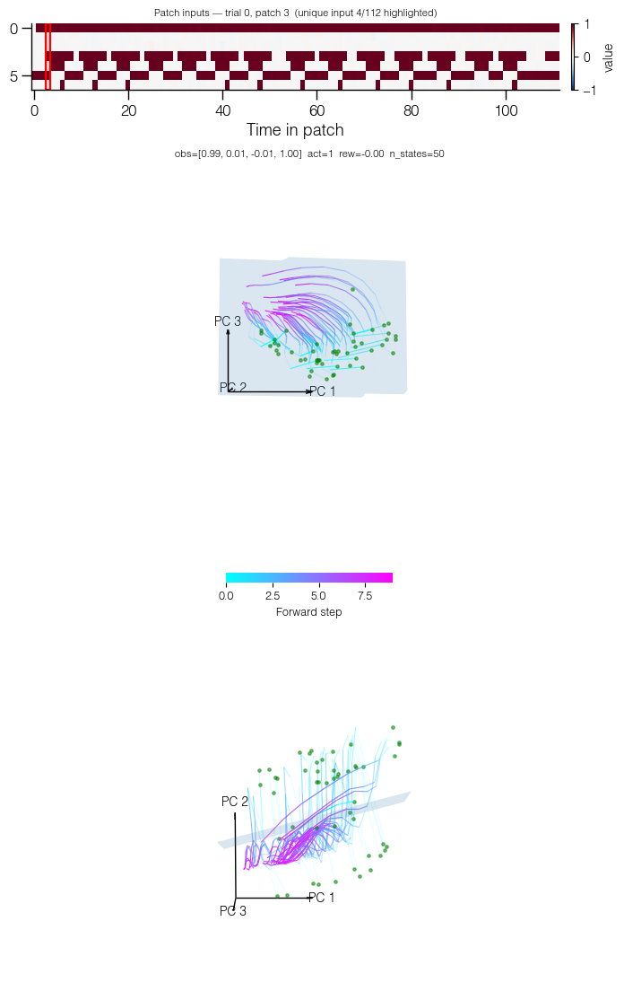

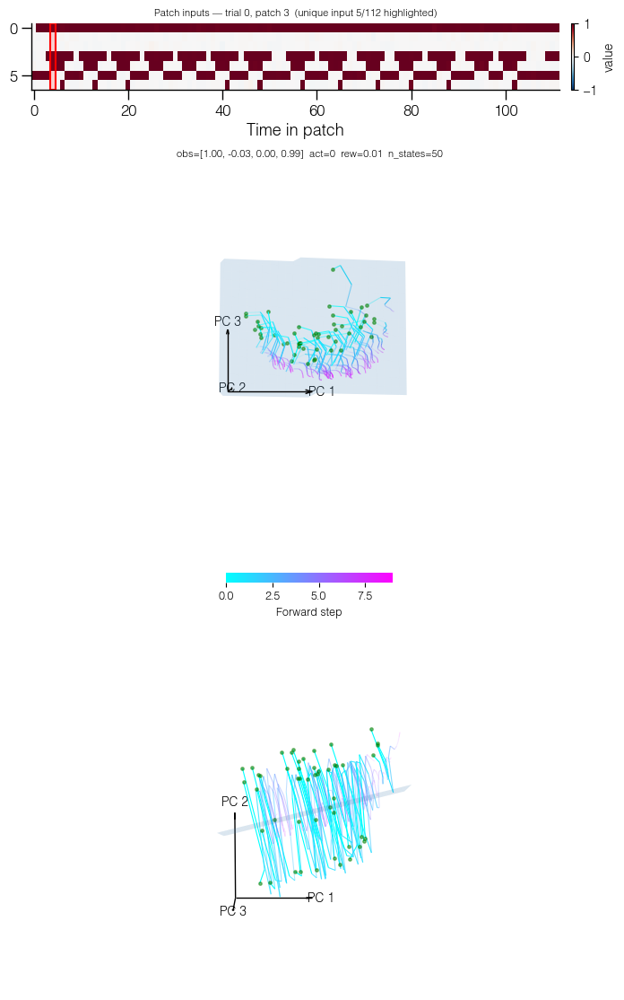

...

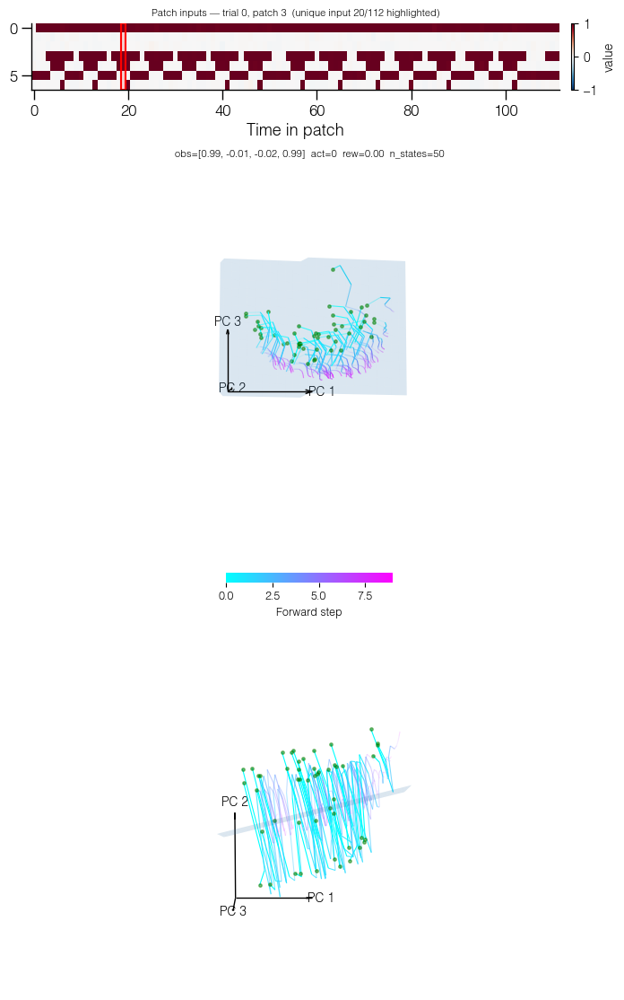

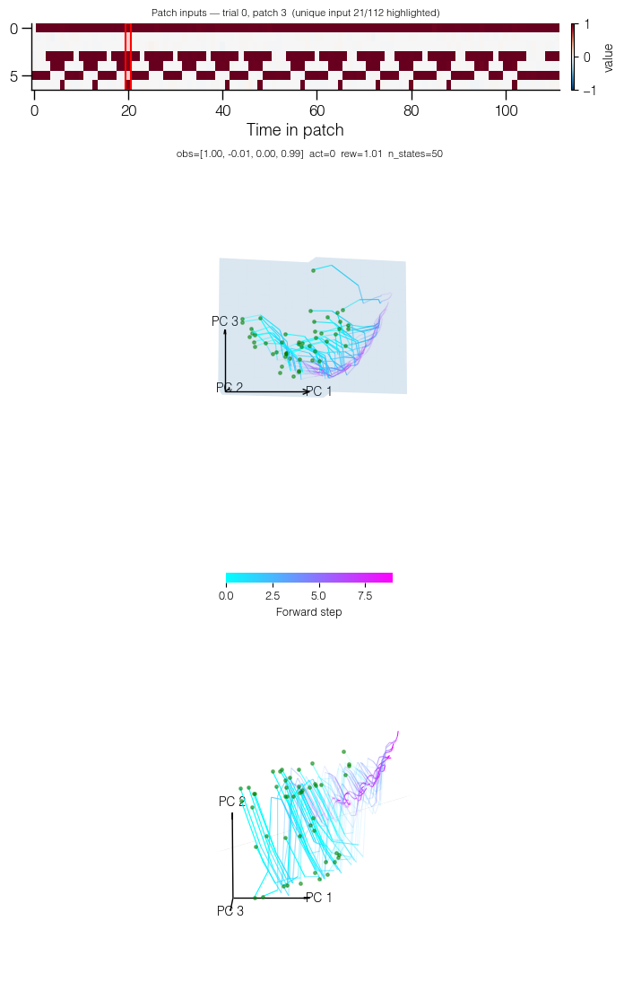

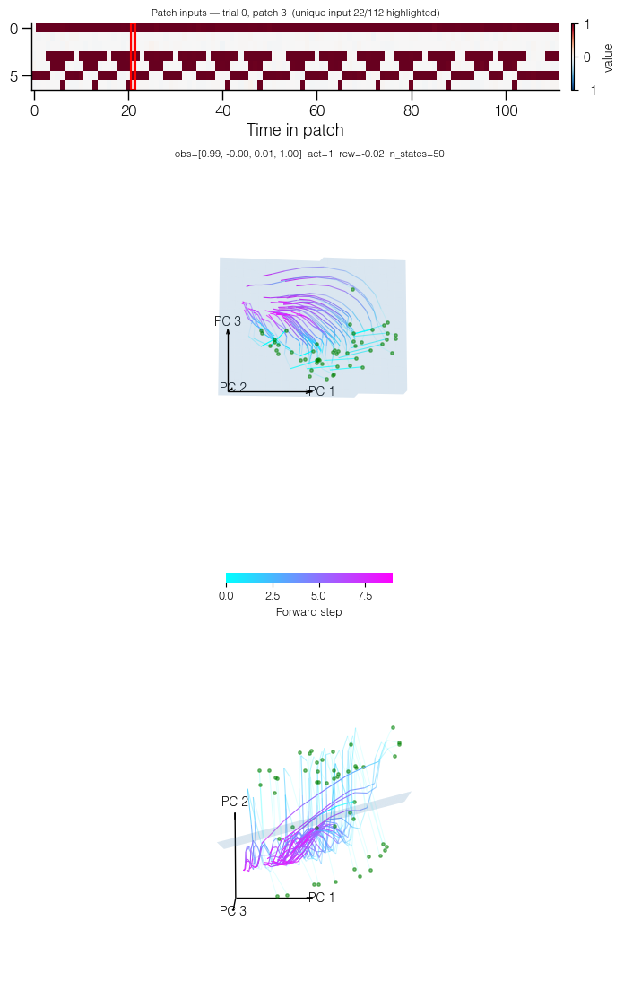

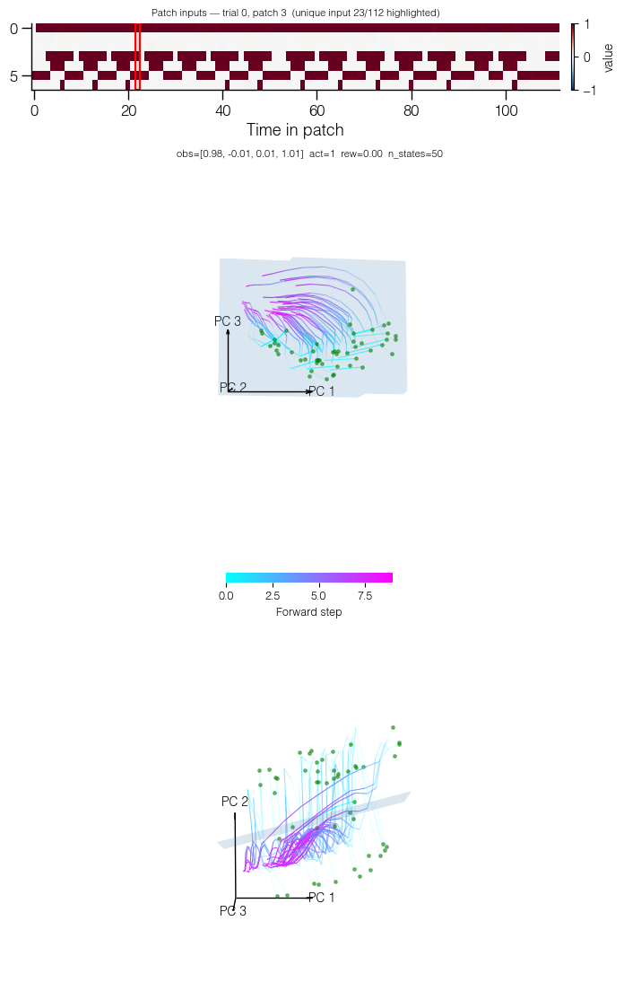

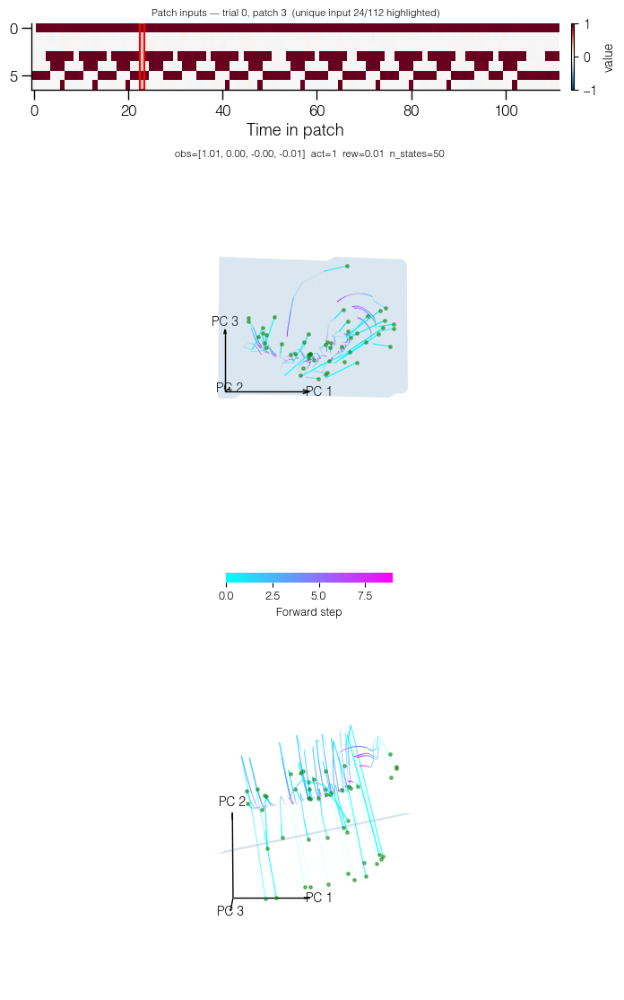

KeyboardInterrupt: 

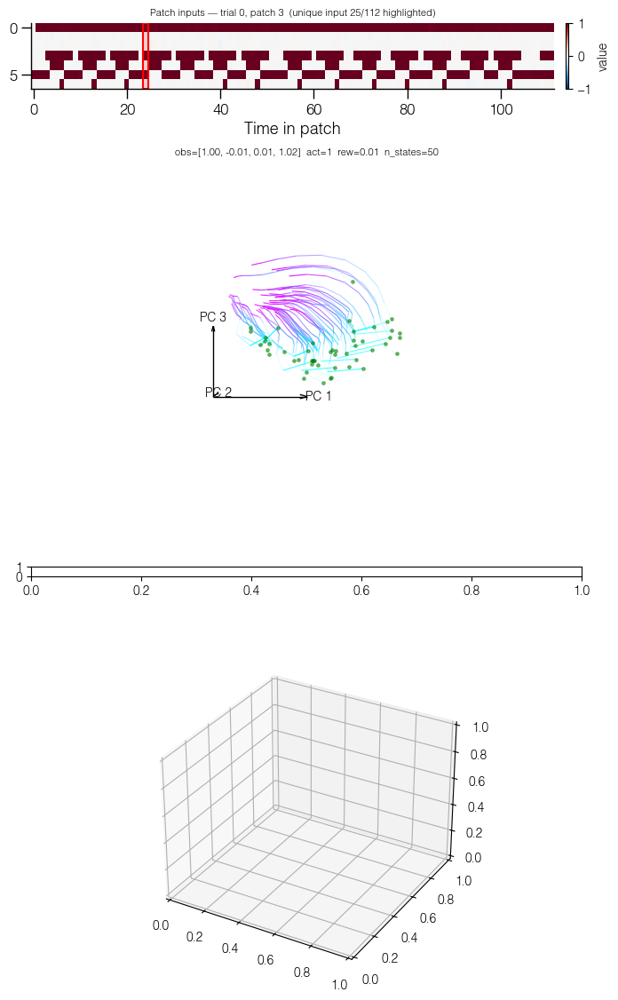

In [18]:
for net_idx, (traj_path, ckpt_path) in enumerate(
    zip(CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES, CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS)):
    print(f'{"="*60}')
    print(f'Network {net_idx}')
    print(f'{"="*60}')

    # Load trajectory data and fit PCA
    traj_data = {}
    for env_idx in range(5):
        traj_data_raw = load_trajectory_data(traj_path)
        traj_data_env = parse_behavioral_data(traj_data_raw[env_idx])
        for key in traj_data_env.keys():
            if key in traj_data:
                traj_data[key] = np.concatenate([traj_data[key], traj_data_env[key]], axis=0)
            else:
                traj_data[key] = traj_data_env[key]

    pca = PCA()
    pca.fit(traj_data['actor_hidden'])
    pc_activities = pca.transform(traj_data['actor_hidden'])

    # Load checkpoint params for this network
    restored   = checkpoints.restore_checkpoint(
            ckpt_dir=Path(ckpt_path).resolve(), target=train_state)
    net_params = restored.params

    plot_patch_segments_with_fixed_points(
        traj_data, net_params, network, pca,
        trial_idx=0,
        patch_idx=3,
        patch_type=2,
        n_fp_attempts=300,
        fp_tol=1e-3,
        azim=270,
        elev=0,
        azim2=270,
        elev2=100,
        round_inputs_for_uniqueness=True,
        includes_actions_and_rewards=True,
        stop_after_unique_inputs=True,
        traj_cmap=sns.color_palette(palette='cool', as_cmap=True),
        save_dir=os.path.join('../../../figures', Path(traj_path).parent.name),
        plot_current_segment=False,
    )

    plot_patch_segments_forward_runs(
        traj_data, net_params, network, pca,
        trial_idx=0,
        patch_idx=3,
        patch_type=2,
        n_states=50,
        n_forward_steps=10,
        azim=270,
        elev=0,
        azim2=270,
        elev2=100,
        includes_actions_and_rewards=True,
        traj_cmap=sns.color_palette(palette='cool', as_cmap=True),
        save_dir=os.path.join('../../../figures', Path(traj_path).parent.name),
    )

### States immediately prior to odor onset
Within a patch but immediately prior to odor onset, states have graded accumulated reward representations. They also contain significant information about the duration of the inter site interval immediately prior to them. 

=== Network 0: ../../../results/fixed_exp_gru_initial_prob_offset_high_becomes_low/step_00/traj_000000.pkl ===


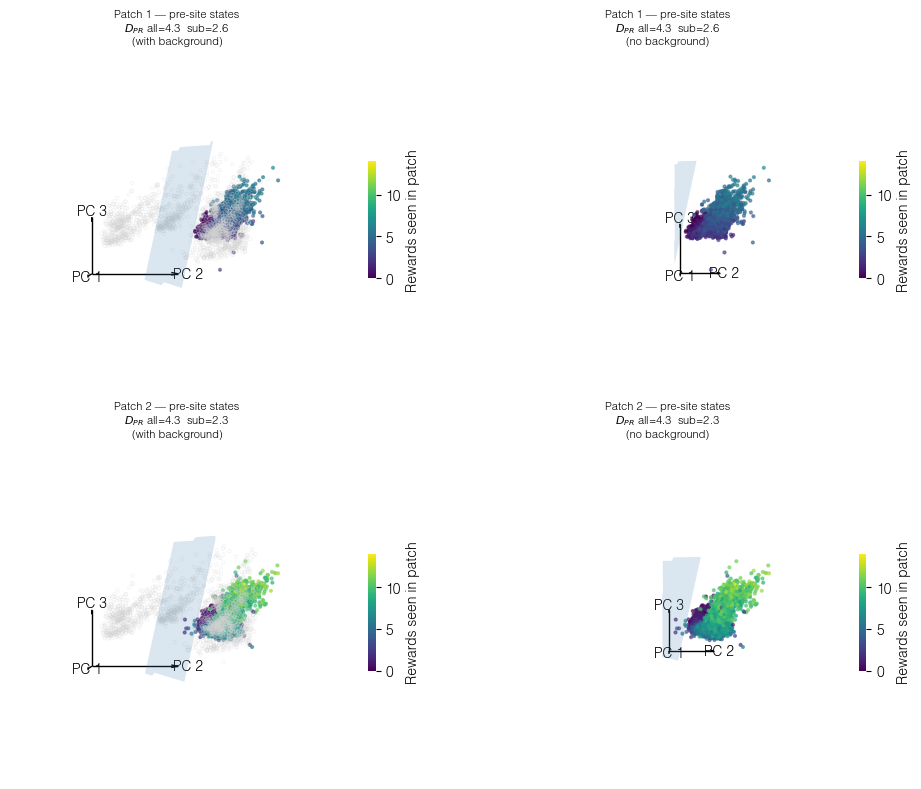

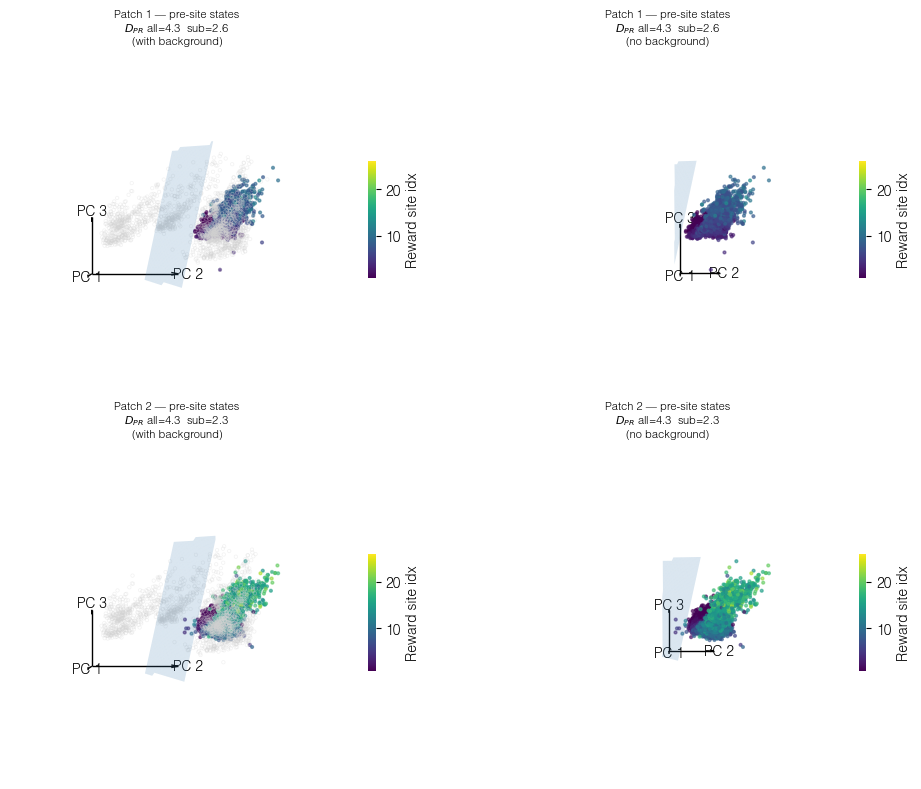

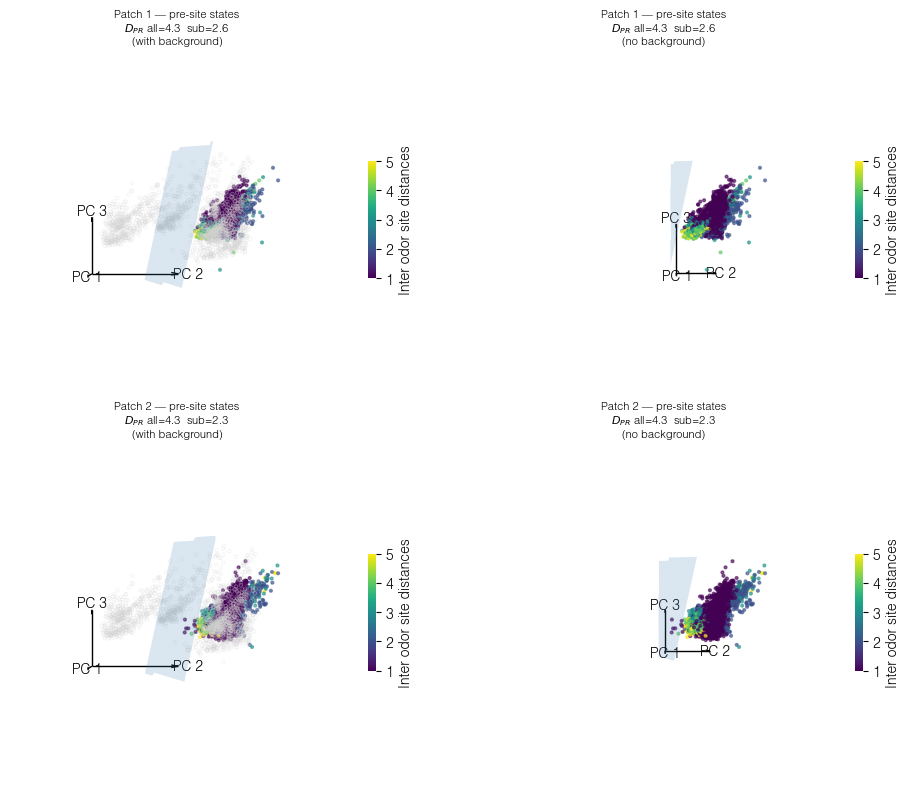

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [20]:
for net_idx, (dir_path, ckpt_path) in enumerate(zip(CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES, CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS)):
    print(f'=== Network {net_idx}: {dir_path} ===')

    traj_data = {}
    for env_idx in range(5):
        traj_data_raw = load_trajectory_data(dir_path)
        traj_data_env = parse_behavioral_data(traj_data_raw[env_idx])
        for key in traj_data_env.keys():
            if key in traj_data:
                traj_data[key] = np.concatenate([traj_data[key], traj_data_env[key]], axis=0)
            else:
                traj_data[key] = traj_data_env[key]

    pca = PCA()
    pca.fit(traj_data['actor_hidden'])
    pc_activities = pca.transform(traj_data['actor_hidden'])

    net_restored = checkpoints.restore_checkpoint(ckpt_dir=Path(ckpt_path).resolve(), target=train_state)
    net_params = net_restored.params

    network_name = Path(dir_path).parent.name
    save_dir = os.path.join('../../../figures', network_name)
    os.makedirs(save_dir, exist_ok=True)

    color_bys = ['inter_odor_site_distances', 'rewards_seen_in_patch', 'reward_site_idx']
    colorbar_labels = ['Inter odor site distance', 'Rewards seen in patch', 'Reward site']
    figs = [
        plot_pre_odor_site_states_3d(
            traj_data,
            pca,
            params=net_params,
            color_by=color_by,
            azim1=0, elev1=0, azim2=0, elev2=0,
        )
        for color_by, cbar_label in zip(color_bys, colorbar_labels)
    ]

    for color_by, fig in zip(color_bys, figs):
        plt.figure(fig.number) 
        fig.savefig(os.path.join(save_dir, f'pre_odor_site_states_3d_{color_by}.svg'), bbox_inches='tight')
        plt.show()

For each network, take pre‑odor‑onset states and plot how the action **separatrix distance** (the decision variable) — at the state and 4 steps later — varies along several 1‑D summaries: a 3‑D PCA view, pre‑odor PC1, patch progress (per‑patch and patch‑2 metrics), and the fixed‑point axis (first PC of fixed points for input `[1,0,0,0,0,1,0]`).

=== Network 0: ../../../results/fixed_exp_gru_initial_prob_offset_high_becomes_low/step_00/traj_000000.pkl ===


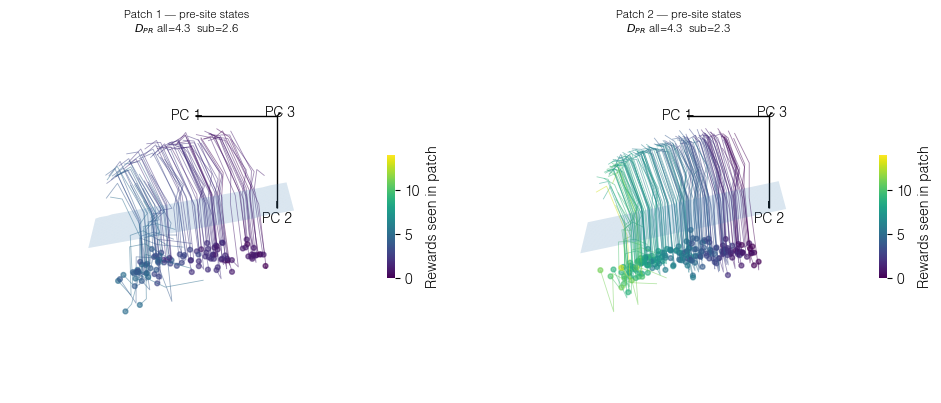

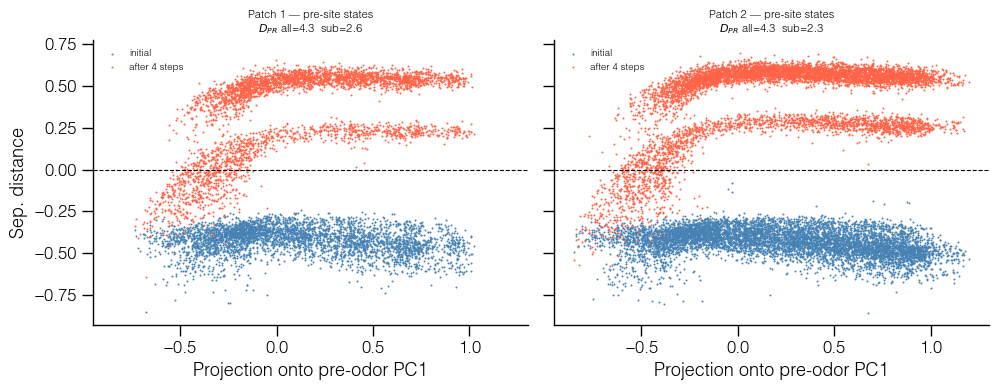

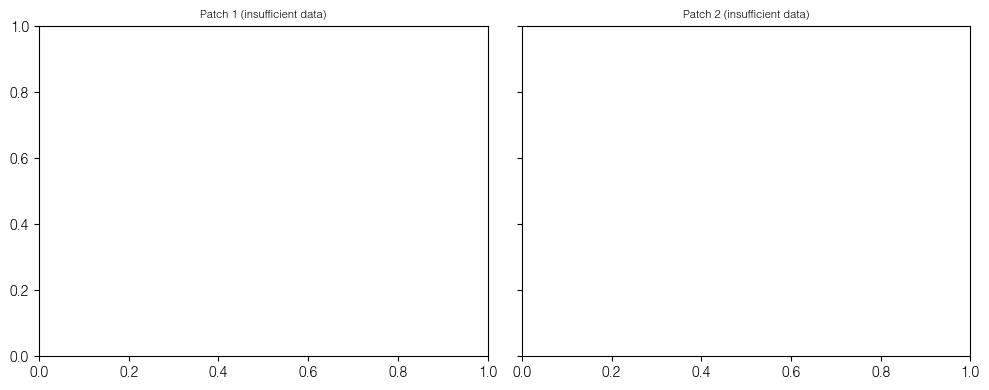

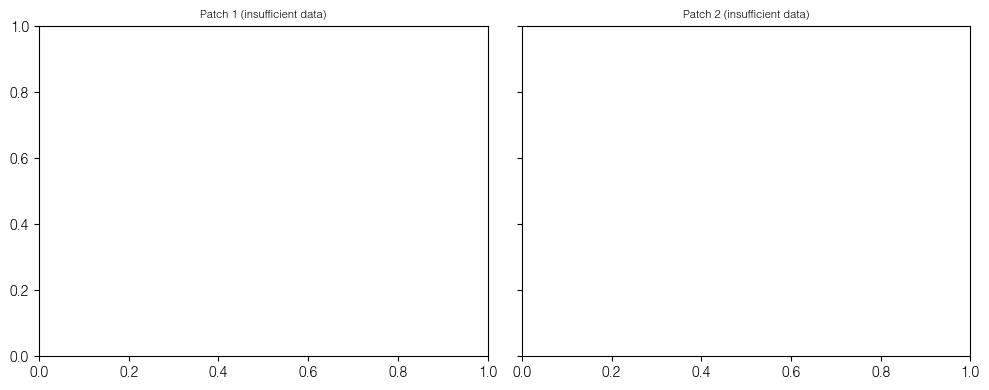

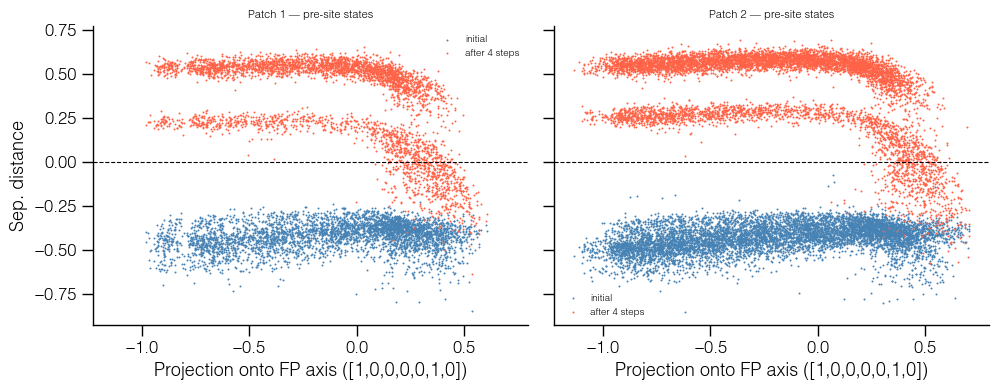

In [24]:
for net_idx, (dir_path, ckpt_path) in enumerate(zip(CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES, CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS)):
    print(f'=== Network {net_idx}: {dir_path} ===')

    traj_data = {}
    for env_idx in range(5):
        traj_data_raw = load_trajectory_data(dir_path)
        traj_data_env = parse_behavioral_data(traj_data_raw[env_idx])
        for key in traj_data_env.keys():
            if key in traj_data:
                traj_data[key] = np.concatenate([traj_data[key], traj_data_env[key]], axis=0)
            else:
                traj_data[key] = traj_data_env[key]

    pca = PCA()
    pca.fit(traj_data['actor_hidden'])
    pc_activities = pca.transform(traj_data['actor_hidden'])

    net_restored = checkpoints.restore_checkpoint(
        ckpt_dir=Path(ckpt_path).resolve(), target=train_state)
    net_params = net_restored.params

    fig1, fig2, fig3, fig4, fig5, fig6 = plot_pre_patch_states_with_next_3d(
        traj_data,
        net_params,
        pca,
        color_by='rewards_seen_in_patch',
        cbar_label='Rewards seen in patch',
        azim=90,
        elev=90,
        network=network,
    )
    fig1.savefig(f'../../../figures/pre_patch_states_with_next_net{net_idx}.png',
                 dpi=300, bbox_inches='tight')
    plt.show(fig1); plt.close(fig1)
    fig2.savefig(f'../../../figures/pre_patch_sep_dist_net{net_idx}.png',
                 dpi=300, bbox_inches='tight')
    plt.show(fig2); plt.close(fig2)
    if fig3 is not None:
        fig3.savefig(f'../../../figures/pre_patch_fp_pc1_net{net_idx}.png',
                     dpi=300, bbox_inches='tight')
        plt.show(fig3); plt.close(fig3)
    fig4.savefig(f'../../../figures/pre_patch_progress_net{net_idx}.png',
                 dpi=300, bbox_inches='tight')
    plt.show(fig4); plt.close(fig4)
    fig5.savefig(f'../../../figures/pre_patch_progress_p2_net{net_idx}.png',
                 dpi=300, bbox_inches='tight')
    plt.show(fig5); plt.close(fig5)
    if fig6 is not None:
        fig6.savefig(f'../../../figures/pre_patch_fp_axis_net{net_idx}.png',
                     dpi=300, bbox_inches='tight')
        plt.show(fig6); plt.close(fig6)


### Probe the agent with synthetic reward patterns in the real environment
Drive the trained agent through the actual treadmill environment but override the reward at each site with a specified pattern (all‑rewarded vs. never‑rewarded), starting in a patch‑type‑2 patch. Visualizes the resulting hidden‑state trajectories (3‑D PCA, colored by time and by patch progress), separatrix distance vs. time, exit statistics, and observation heatmaps.

Network 0 ../../../results/fixed_exp_gru_initial_prob_offset_high_becomes_low/step_00/traj_000000.pkl


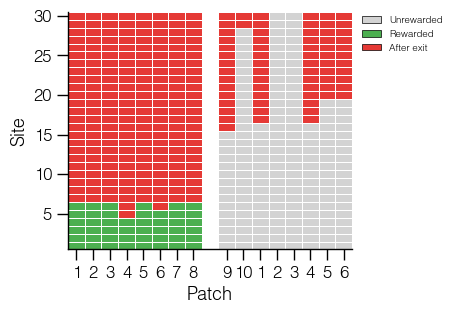

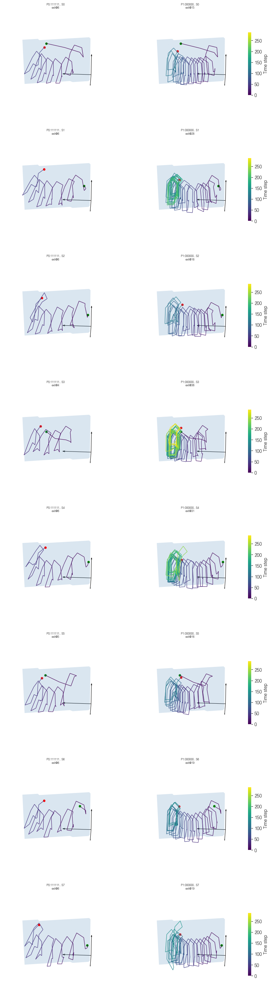

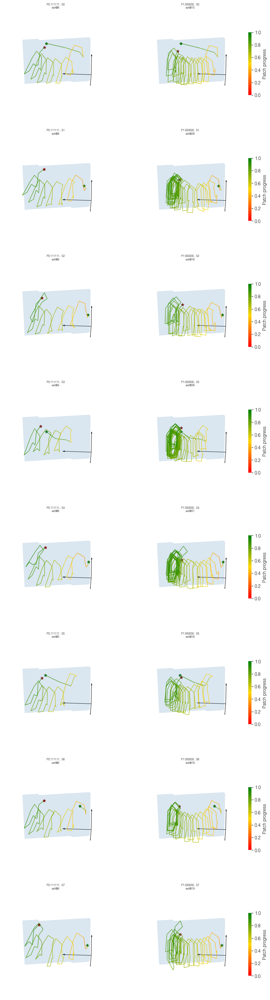

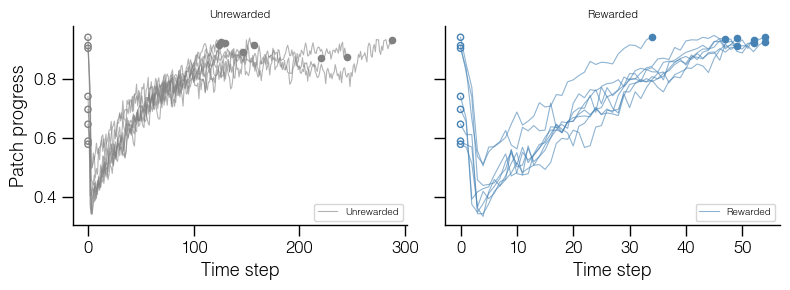

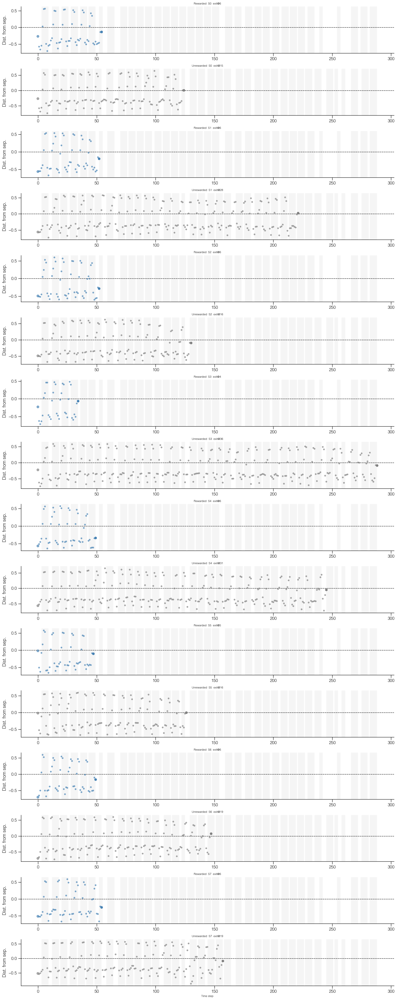

...

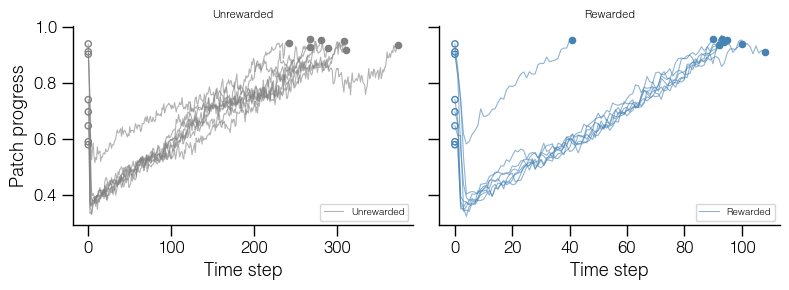

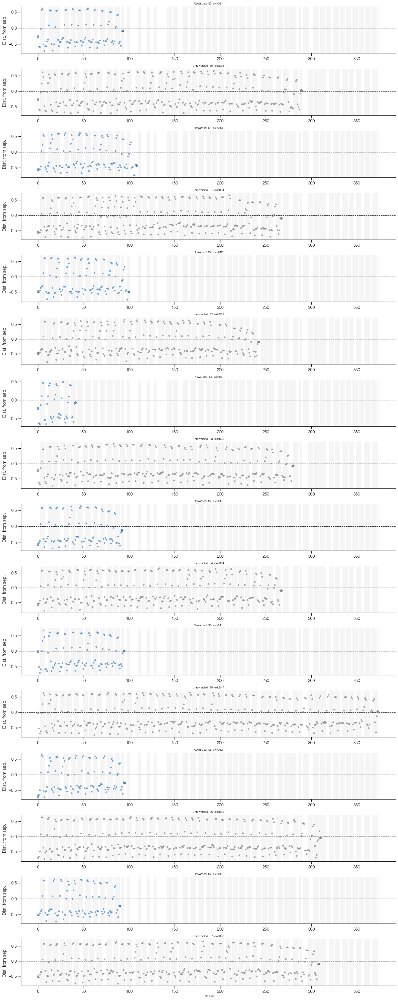

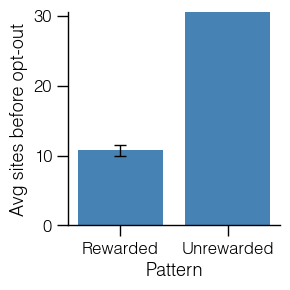

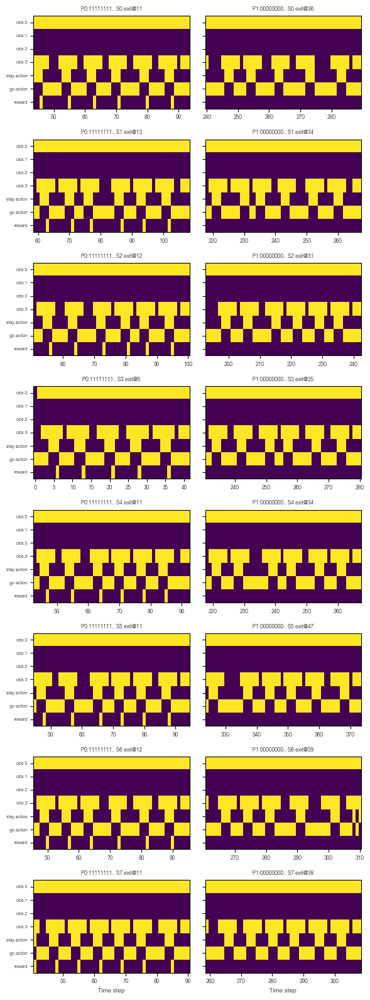

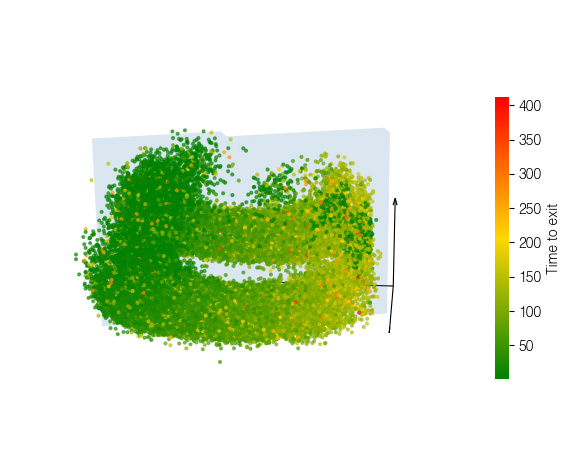

In [26]:
# PCA trajectories for two extreme reward patterns (environment rollout)
for net_idx in range(len(CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES)):
    if net_idx != 0:
        continue
    dir_path = CURRICULUM_TRAINED_HIGH_BECOMES_LOW_TRAJECTORIES[net_idx]
    ckpt_path = CURRICULUM_TRAINED_HIGH_BECOMES_LOW_CHECKPOINTS[net_idx]
    n_sites  = 30

    print(f'Network {net_idx}', dir_path)

    traj_data = {}
    for env_idx in range(5):
        traj_data_raw = load_trajectory_data(dir_path)
        traj_data_env = parse_behavioral_data(traj_data_raw[env_idx])
        for key in traj_data_env.keys():
            if key in traj_data:
                traj_data[key] = np.concatenate([traj_data[key], traj_data_env[key]], axis=0)
            else:
                traj_data[key] = traj_data_env[key]

    pca = PCA(n_components=3)
    pca.fit(traj_data['actor_hidden'].reshape(-1, 64))

    tte_data = collect_pre_odor_time_to_exit(traj_data, patch_num=2, include_all_patch_states=True)

    reward_patterns_X = [
        [1] * n_sites,   # all rewarded
        [0] * n_sites,   # never rewarded
    ]

    for patch_num in [1, 2]:
        # Same reward patterns, driven through the real environment
        (fig_matrix, fig_pca, fig_pca_pp, fig_pp, fig_sep, fig_exit_stats, fig_obs, fig_tte, exit_sites) = run_specified_reward_patterns_env_pca(
            reward_patterns_X,
            ckpt_path=ckpt_path,
            train_state=train_state,
            network=network,
            traj_data=traj_data,
            pca=pca,
            tte_data=tte_data,
            n_initial_states=8,
            patch_num=patch_num,
            max_steps=400,
            azim=95,
            elev=20,
            seed=20,
        )

        plt.show(fig_matrix)
        plt.close(fig_matrix)
        plt.show(fig_pca)
        plt.close(fig_pca)
        if fig_pca_pp is not None:
            plt.show(fig_pca_pp)
            plt.close(fig_pca_pp)
        plt.show(fig_pp)
        plt.close(fig_pp)
        plt.show(fig_sep)
        plt.close(fig_sep)
        plt.show(fig_exit_stats)
        plt.close(fig_exit_stats)
        plt.show(fig_obs)
        plt.close(fig_obs)
        if fig_tte is not None:
            plt.show(fig_tte)
            plt.close(fig_tte)